In [1]:
# CELL 1 — Imports
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import owlready2
import scipy

from owlready2 import *
from neo4j import GraphDatabase
from openai import OpenAI
import faiss

In [2]:
# Cell 2 version A — Load the NURE Sediment Dataset (CSV Version)

import pandas as pd
import os

DATA_PATH = "data/nuresed-fUS13.csv"

# Check if file exists
if not os.path.exists(DATA_PATH):
    print(" File not found!")
    print(" Make sure 'nuresed-fUS13.csv' is inside the 'data' folder.")
else:
    print(" File found. Loading dataset...")

    # Load CSV
    df = pd.read_csv(DATA_PATH)
    df.columns = df.columns.str.lower()

    print(" Dataset loaded successfully!")

    # Show preview
    display(df.head())

    # Basic info (very helpful for students)
    print("\n Dataset shape:", df.shape)
    print("\n Columns:")
    print(df.columns.tolist())

print([col for col in df.columns if "si" in col])

print(df.shape)
print(df.columns.tolist())
import pandas as pd

df = pd.read_csv(DATA_PATH, encoding='latin1')
df.columns = df.columns.str.lower()

print(df.shape)
print(df.columns.tolist()[:20])

 File found. Loading dataset...
 Dataset loaded successfully!


,rec_no,prime_id,replc,samptyp,rec_cnt,latitude,longitude,doelab,laslid,ornlid,...,zn_ppm,zr_ppm,po4_ppm,so4_ppm,methods,tapefile,reformat,coordprb,comments,comment2
0,5270232,GAFA001S1,0,50,1,34.9592,-84.6116,SRL-E,NaN,NaN,...,NaN,NaN,NaN,NaN,"SR1, SR2",XG0567.14,GOLD VALUE ADDED BASED ON GJBX-135(82):,REDIGITIZED SAMPLE LOCATION: CHANGED LAT & LON...,NaN,NaN
1,5270233,GAFA002S1,0,50,1,34.9043,-84.5226,SRL-E,NaN,NaN,...,NaN,NaN,NaN,NaN,"SR1, SR2",XG0567.14,CONTAMC(UNKNOWN) IS PROBABLY RESIDENTIAL OR RE...,REDIGITIZED SAMPLE LOCATION: CHANGED LAT & LON...,NaN,NaN
2,5270234,GAFA003S1,0,50,1,34.9403,-84.4728,SRL-E,NaN,NaN,...,NaN,NaN,NaN,NaN,"SR1, SR2",XG0567.14,GOLD VALUE ADDED BASED ON GJBX-135(82):,REDIGITIZED SAMPLE LOCATION: CHANGED LAT & LON...,NaN,NaN
3,5270235,GAFA004S1,0,50,1,34.9690,-84.4307,SRL-E,NaN,NaN,...,NaN,NaN,NaN,NaN,"SR1, SR2",XG0567.14,GOLD VALUE ADDED BASED ON GJBX-135(82):,REDIGITIZED SAMPLE LOCATION: CHANGED LAT & LON...,NaN,NaN
4,5270236,GAFA005S1,0,50,1,34.9494,-84.4382,SRL-E,NaN,NaN,...,NaN,NaN,NaN,NaN,"SR1, SR2",XG0567.14,GOLD VALUE ADDED BASED ON GJBX-135(82):,REDIGITIZED SAMPLE LOCATION: CHANGED LAT & LON...,NaN,NaN



 Dataset shape: (6844, 145)

 Columns:
['rec_no', 'prime_id', 'replc', 'samptyp', 'rec_cnt', 'latitude', 'longitude', 'doelab', 'laslid', 'ornlid', 'srlid', 'lllid', 'site', 'state', 'quad', 'mapcode', 'fips', 'huc8', 'ls_map', 'study', 'phase', 'strbasin', 'b_lat_c', 'b_long_c', 'smpmedia', 'sampsrc', 'sedcond', 'sizefrxn', 'osamptyp', 'lsamptyp', 'ssamptyp', 'sedtreat', 'sampdat', 'samphr', 'sampler', 'grabs', 'weather', 'airtemp', 'wtrtemp', 'ph', 'cond', 'alk', 'o_diss', 'scin', 'orgn_pct', 'sampodor', 'smpcolr', 'sgeounit', 'rocktyp', 'rockclr', 'sedtype', 'sedcolr', 'strwdth', 'strwdthc', 'strdpth', 'strdpthc', 'wtrlevel', 'strflow', 'strflowc', 'wtrcolr', 'strchanl', 'vegtype', 'vegdens', 'relief', 'contamc', 'specms', 'tapedata', 'analdate', 'batch_es', 'asbatch', 'clbatch', 'po4batch', 'snbatch', 'hgbatch', 'ubatch_dn', 'ubatch_fl', 'ubatch_ms', 'ubatch_xx', 'u_xx_mthd', 'u_xx_ppm', 'u_dn_ppm', 'u_fl_ppm', 'u_ms_ppm', 'u_na_ppm', 'ag_ppm', 'al_pct', 'as_ppm', 'au_ppm', 'b_ppm

#   | Pros           | Cons           |
    | ------ | -------------- | -------------- |
    | Excel  | familiar       | needs openpyxl |
    | CSV    | simple, robust | less “pretty”  |


In [3]:
# CELL 3 — Clean and Prepare the Data

def clean_numeric(series):
    
    series = series.astype(str)
    series = series.str.replace('<', '', regex=False)
    series = series.str.replace('>', '', regex=False)
    series = series.str.replace('ND', '', regex=False)
    series = series.str.replace('-999', '', regex=False)
    return pd.to_numeric(series, errors='coerce')


# Step 1: Identify geochemical columns measured in ppm
ppm_cols = [c for c in df.columns if c.endswith("_ppm")]

print(f"Number of ppm columns found: {len(ppm_cols)}")
print("Example ppm columns:", ppm_cols[:10])


# Step 2: Clean each ppm column
for col in ppm_cols:
    df[col] = clean_numeric(df[col])

print("Numeric cleaning completed for ppm columns.")


# Step 3: Filter the dataset to Georgia samples only
df = df[df["state"] == "GA"]

print("Filtered to Georgia samples only.")


# Step 4: Remove duplicate rows
df = df.drop_duplicates()

print("Duplicate rows removed.")


# Step 5: Reset index after filtering and cleaning
df.reset_index(drop=True, inplace=True)

print("Index reset completed.")


# Final check
print("\nCleaned Georgia dataset shape:", df.shape)


# Optional preview
display(df.head())

Number of ppm columns found: 54
Example ppm columns: ['u_xx_ppm', 'u_dn_ppm', 'u_fl_ppm', 'u_ms_ppm', 'u_na_ppm', 'ag_ppm', 'as_ppm', 'au_ppm', 'b_ppm', 'ba_ppm']
Numeric cleaning completed for ppm columns.
Filtered to Georgia samples only.
Duplicate rows removed.
Index reset completed.

Cleaned Georgia dataset shape: (6841, 145)


,ï»¿rec_no,prime_id,replc,samptyp,rec_cnt,latitude,longitude,doelab,laslid,ornlid,...,zn_ppm,zr_ppm,po4_ppm,so4_ppm,methods,tapefile,reformat,coordprb,comments,comment2
0,5270232,GAFA001S1,0,50,1,34.9592,-84.6116,SRL-E,NaN,NaN,...,NaN,NaN,NaN,NaN,"SR1, SR2",XG0567.14,GOLD VALUE ADDED BASED ON GJBX-135(82):,REDIGITIZED SAMPLE LOCATION: CHANGED LAT & LON...,NaN,NaN
1,5270233,GAFA002S1,0,50,1,34.9043,-84.5226,SRL-E,NaN,NaN,...,NaN,NaN,NaN,NaN,"SR1, SR2",XG0567.14,CONTAMC(UNKNOWN) IS PROBABLY RESIDENTIAL OR RE...,REDIGITIZED SAMPLE LOCATION: CHANGED LAT & LON...,NaN,NaN
2,5270234,GAFA003S1,0,50,1,34.9403,-84.4728,SRL-E,NaN,NaN,...,NaN,NaN,NaN,NaN,"SR1, SR2",XG0567.14,GOLD VALUE ADDED BASED ON GJBX-135(82):,REDIGITIZED SAMPLE LOCATION: CHANGED LAT & LON...,NaN,NaN
3,5270235,GAFA004S1,0,50,1,34.9690,-84.4307,SRL-E,NaN,NaN,...,NaN,NaN,NaN,NaN,"SR1, SR2",XG0567.14,GOLD VALUE ADDED BASED ON GJBX-135(82):,REDIGITIZED SAMPLE LOCATION: CHANGED LAT & LON...,NaN,NaN
4,5270236,GAFA005S1,0,50,1,34.9494,-84.4382,SRL-E,NaN,NaN,...,NaN,NaN,NaN,NaN,"SR1, SR2",XG0567.14,GOLD VALUE ADDED BASED ON GJBX-135(82):,REDIGITIZED SAMPLE LOCATION: CHANGED LAT & LON...,NaN,NaN


In [9]:
# CELL 3 — Clean Data

def clean_numeric(series):
    """Clean a Series and convert to numeric (invalid → NaN)."""
    series = series.astype(str)                     # ensure string for replace
    series = series.str.replace('&lt;', '', regex=False)  # remove '<'
    series = series.str.replace('&gt;', '', regex=False)  # remove '>'
    series = series.str.replace('ND', '', regex=False)    # remove 'No Data'
    series = series.str.replace('-999', '', regex=False)  # remove placeholder missing
    return pd.to_numeric(series, errors='coerce')  # to numeric; bad values → NaN

# select columns measured in ppm
ppm_cols = [c for c in df.columns if c.endswith("_ppm")]

# clean each ppm column
for col in ppm_cols:
    df[col] = clean_numeric(df[col])

# filter to Georgia samples
df = df[df["state"] == "GA"]

# drop duplicate rows
df = df.drop_duplicates()

# reset index after filtering
df.reset_index(drop=True, inplace=True)

# show (rows, columns) of cleaned GA data
print("Georgia samples:", df.shape)

# Tip: Kernel → Restart Kernel and Run All Cells for a clean run

Georgia samples: (6841, 145)


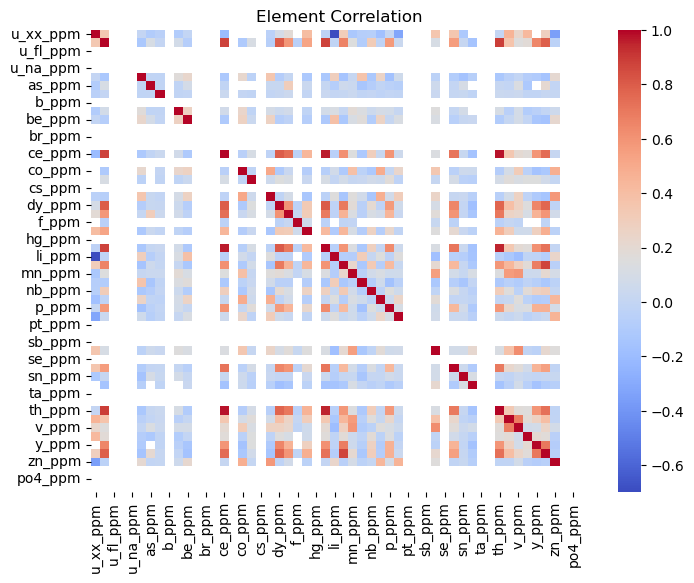

In [10]:
# Cell 3b (virtual option)
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
sns.heatmap(df[ppm_cols].corr(), cmap="coolwarm")
plt.title("Element Correlation")
plt.show()

In [5]:
# STEP 1 — Element Categories (Sustainability Context)

# Elements commonly associated with cosmetics, pigments, or skin-contact materials
cosmetic_elements = [
    "ti_ppm",  # titanium → sunscreen, pigments
    "zn_ppm",  # zinc → sunscreen, skin protection
    "fe_pct",  # iron → pigments (colors)
    "bi_ppm",  # bismuth → cosmetics additives
    "mg_pct",  # magnesium → fillers, powders
    "ca_pct",  # calcium → fillers
    "al_pct",   # aluminum → pigments, coatings
    "si_pct",   # silicon → powder, mattrifying agents
]


# Elements relevant to energy-transition technologies
energy_transition_elements = [
    "li_ppm",  # lithium → batteries
    "co_ppm",  # cobalt → batteries
    "ni_ppm",  # nickel → batteries, alloys
    "mn_ppm",  # manganese → batteries
    "cu_ppm",  # copper → electrical wiring
    "v_ppm",   # vanadium → energy storage
    "mo_ppm",  # molybdenum → alloys, energy systems
    "la_ppm",  # lanthanum → batteries, catalysts
    "ce_ppm",  # cerium → catalysts, energy tech
    "dy_ppm",  # dysprosium → magnets (wind turbines)
    "y_ppm"    # yttrium → electronics, energy materials
]
print(df.columns.tolist())
df.columns = df.columns.str.replace('ï»¿', '')
df.columns = df.columns.str.lower()

# Quick check: which of these columns exist in the dataset?
available_cosmetic = [col for col in cosmetic_elements if col in df.columns]
available_energy = [col for col in energy_transition_elements if col in df.columns]

print("Available cosmetic-related elements:", available_cosmetic)
print("Available energy-transition elements:", available_energy)

['rec_no', 'prime_id', 'replc', 'samptyp', 'rec_cnt', 'latitude', 'longitude', 'doelab', 'laslid', 'ornlid', 'srlid', 'lllid', 'site', 'state', 'quad', 'mapcode', 'fips', 'huc8', 'ls_map', 'study', 'phase', 'strbasin', 'b_lat_c', 'b_long_c', 'smpmedia', 'sampsrc', 'sedcond', 'sizefrxn', 'osamptyp', 'lsamptyp', 'ssamptyp', 'sedtreat', 'sampdat', 'samphr', 'sampler', 'grabs', 'weather', 'airtemp', 'wtrtemp', 'ph', 'cond', 'alk', 'o_diss', 'scin', 'orgn_pct', 'sampodor', 'smpcolr', 'sgeounit', 'rocktyp', 'rockclr', 'sedtype', 'sedcolr', 'strwdth', 'strwdthc', 'strdpth', 'strdpthc', 'wtrlevel', 'strflow', 'strflowc', 'wtrcolr', 'strchanl', 'vegtype', 'vegdens', 'relief', 'contamc', 'specms', 'tapedata', 'analdate', 'batch_es', 'asbatch', 'clbatch', 'po4batch', 'snbatch', 'hgbatch', 'ubatch_dn', 'ubatch_fl', 'ubatch_ms', 'ubatch_xx', 'u_xx_mthd', 'u_xx_ppm', 'u_dn_ppm', 'u_fl_ppm', 'u_ms_ppm', 'u_na_ppm', 'ag_ppm', 'al_pct', 'as_ppm', 'au_ppm', 'b_ppm', 'ba_ppm', 'be_ppm', 'bi_ppm', 'br_ppm

In [6]:
# Summerize: STEP 1 — Element Categories
# ============================================================
# Define element groups used in the classroom project
# ============================================================

# Elements commonly associated with cosmetics, pigments, or skin‑contact materials
cosmetic_elements = [
    "ti_ppm", "zn_ppm", "fe_pct", "bi_ppm",
    "mg_pct", "ca_pct", "al_pct"
]

# Elements relevant to energy‑transition technologies (batteries, magnets, alloys)
energy_transition_elements = [
    "li_ppm", "co_ppm", "ni_ppm", "mn_ppm",
    "cu_ppm", "v_ppm", "mo_ppm",
    "la_ppm", "ce_ppm", "dy_ppm", "y_ppm"
]


In [8]:
# ============================================================
# STEP 2 — Project Focus (Sustainability Domain)
# ============================================================

"""
1.  Cosmetic Materials
   → Elements used in makeup, pigments, and skin-contact products

2. Energy Transition Materials
   → Elements used in batteries, renewable energy, and clean technology

Different materials play different roles in sustainability:

- Energy materials → help reduce carbon emissions
- Cosmetic materials → affect human health and everyday exposure
"""
print(df.shape)
print(df.columns.tolist())

# 🔹 Project type
project_type = "cosmetic"   

# 🔹 Correct element list
if project_type == "cosmetic":
    selected_elements = cosmetic_elements
elif project_type == "energy":
    selected_elements = energy_transition_elements
else:
    raise ValueError(" Invalid choice. Please choose 'cosmetic' or 'energy'")

available_elements = [col for col in selected_elements if col in df.columns]

# 🔹 Output results
print(f"\nProject type selected: {project_type.upper()}")
print("\nElements available in your dataset:")
print(available_elements)

print(f"\n Number of elements selected: {len(available_elements)}")

(6841, 145)
['rec_no', 'prime_id', 'replc', 'samptyp', 'rec_cnt', 'latitude', 'longitude', 'doelab', 'laslid', 'ornlid', 'srlid', 'lllid', 'site', 'state', 'quad', 'mapcode', 'fips', 'huc8', 'ls_map', 'study', 'phase', 'strbasin', 'b_lat_c', 'b_long_c', 'smpmedia', 'sampsrc', 'sedcond', 'sizefrxn', 'osamptyp', 'lsamptyp', 'ssamptyp', 'sedtreat', 'sampdat', 'samphr', 'sampler', 'grabs', 'weather', 'airtemp', 'wtrtemp', 'ph', 'cond', 'alk', 'o_diss', 'scin', 'orgn_pct', 'sampodor', 'smpcolr', 'sgeounit', 'rocktyp', 'rockclr', 'sedtype', 'sedcolr', 'strwdth', 'strwdthc', 'strdpth', 'strdpthc', 'wtrlevel', 'strflow', 'strflowc', 'wtrcolr', 'strchanl', 'vegtype', 'vegdens', 'relief', 'contamc', 'specms', 'tapedata', 'analdate', 'batch_es', 'asbatch', 'clbatch', 'po4batch', 'snbatch', 'hgbatch', 'ubatch_dn', 'ubatch_fl', 'ubatch_ms', 'ubatch_xx', 'u_xx_mthd', 'u_xx_ppm', 'u_dn_ppm', 'u_fl_ppm', 'u_ms_ppm', 'u_na_ppm', 'ag_ppm', 'al_pct', 'as_ppm', 'au_ppm', 'b_ppm', 'ba_ppm', 'be_ppm', 'bi_p

In [9]:
# ============================================================
# STEP 2 — Project category
# ============================================================

project_type = "cosmetic" 

if project_type == "cosmetic":
    available_elements = cosmetic_elements
elif project_type == "energy":
    available_elements = energy_transition_elements
else:
    raise ValueError("Choose 'cosmetic' or 'energy'")

print("Available elements for this project:")
print(available_elements)


Available elements for this project:
['ti_ppm', 'zn_ppm', 'fe_pct', 'bi_ppm', 'mg_pct', 'ca_pct', 'al_pct']


In [10]:
# ============================================================
# STEP 2b— Cosmetic Materials Focus
# ============================================================

"""
Cosmetic materials directly affect human health because:
✔ they are applied to the skin
✔ they can be absorbed or inhaled
✔ they may contain trace metals

Understanding their concentration helps us think about:
- exposure risk
- safety
- environmental impact

Not all minerals are just resources — some directly affect people’s daily lives.
"""

project_type = "cosmetic"

selected_elements = cosmetic_elements

available_elements = [col for col in selected_elements if col in df.columns]

print(" Project type: COSMETIC MATERIALS")

print("\n Cosmetic-related elements available in dataset:")
print(available_elements)

print(f"\n Number of elements selected: {len(available_elements)}")

 Project type: COSMETIC MATERIALS

 Cosmetic-related elements available in dataset:
['ti_ppm', 'zn_ppm', 'fe_pct', 'bi_ppm', 'mg_pct', 'ca_pct', 'al_pct']

 Number of elements selected: 7


In [12]:
# STEP 3 — Selected Element

print("Available elements:")
print(available_elements)

element = "li_ppm"     

element = "al_pct"   


if element not in available_elements:
    print(" Invalid choice!")
    print(" Please select from this list:")
    print(available_elements)
else:
    print(" Selected element:", element)

Available elements:
['ti_ppm', 'zn_ppm', 'fe_pct', 'bi_ppm', 'mg_pct', 'ca_pct', 'al_pct']
 Selected element: al_pct


In [13]:
element = "al_pct"   

if element not in available_elements:
    raise ValueError("Element must be selected from the available list.")

print("Selected element:", element)


Selected element: al_pct


In [14]:
# CELL 4 — Selected Element Table

element = "al_pct"

df_element = df[["rec_no", "latitude", "longitude", element]].dropna()

df_element.head()


,rec_no,latitude,longitude,al_pct
0,5270232,34.9592,-84.6116,1.38
1,5270233,34.9043,-84.5226,3.67
2,5270234,34.9403,-84.4728,2.37
3,5270235,34.9690,-84.4307,2.47
4,5270236,34.9494,-84.4382,1.68


In [19]:
from owlready2 import *

onto = get_ontology("http://example.org/student_nure.owl")

with onto:

    # -------------------------
    # CLASSES
    # -------------------------
    class Sample(Thing): pass
    class Element(Thing): pass
    class Concentration(Thing): pass
    class Location(Thing): pass
    class CosmeticProduct(Thing): pass
    class Measurement(Thing): pass
    class CosmeticElement(Element): pass
    class EnergyTransitionElement(Element): pass

    # -------------------------
    # Element hierarchy (adds depth)
    # -------------------------
    class Metalloid(Element): pass
    class NonMetal(Element): pass

    class Silicon(Metalloid): pass
    class Oxygen(NonMetal): pass
    class Iron(Metalloid): pass


    # -------------------------
    # PROPERTIES
    # -------------------------
    class hasElement(ObjectProperty):
        domain = [Sample]
        range = [Element]

    class hasConcentration(ObjectProperty):
        domain = [Sample]
        range = [Concentration]

    class ofElement(ObjectProperty):
        domain = [Concentration]
        range = [Element]

    class hasValue(DataProperty):
        domain = [Concentration]
        range = [float]

    class measuredIn(Location >> Sample): pass
    class usedIn(Element >> CosmeticProduct): pass
    class derivedFrom(Sample >> Location): pass

    # =========================
    # DATA PROPERTIES
    # =========================
    class concentrationValue(Measurement >> float, DataProperty): pass
    class unit(Measurement >> str, DataProperty): pass

    # =========================
    # CLASS RESTRICTIONS (KEY FOR COMPLEXITY)
    # =========================

    class ChemicalSample(Sample):
        equivalent_to = [
            Sample & (hasElement.some(Element))
        ]

    class HighSiliconSample(Sample):
        equivalent_to = [
            Sample & (hasElement.some(Silicon))
        ]

    class CosmeticRelevantSample(Sample):
        equivalent_to = [
            Sample & (hasElement.some(Silicon))
        ]

    # -------------------------
    # ELEMENTS
    # -------------------------
    Aluminum = Element("Aluminum")
    Titanium = Element("Titanium")
    Silica = Element("Silica")
    
    # =========================
    # INDIVIDUALS
    # =========================

    # Locations
    lab_ga = Location("Georgia_Lab")
    lab_ca = Location("California_Lab")

    # Cosmetic products
    foundation = CosmeticProduct("Silicone_Foundation")
    serum = CosmeticProduct("Hydrating_Serum")

    # Elements
    si = Silicon("Silicon_Element")
    fe = Iron("Iron_Element")
    o = Oxygen("Oxygen_Element")

    # Measurements
    m1 = Measurement("Measurement_1")
    m1.concentrationValue = [42.5]
    m1.unit = ["ppm"]

    m2 = Measurement("Measurement_2")
    m2.concentrationValue = [12.0]
    m2.unit = ["ppm"]

    # Samples (core of graph complexity)
    s1 = Sample("Sample_1")
    s2 = Sample("Sample_2")
    s3 = Sample("Sample_3")
    # =========================
    # RELATIONSHIPS (GRAPH DENSITY BOOST)
    # =========================

    s1.hasElement = [si, fe]
    s1.hasMeasurement = [m1]
    s1.derivedFrom = [lab_ga]

    s2.hasElement = [si]
    s2.hasMeasurement = [m2]
    s2.derivedFrom = [lab_ca]

    s3.hasElement = [o, si]
    s3.derivedFrom = [lab_ga]

    # Element → product links
    si.usedIn = [foundation, serum]
    fe.usedIn = [foundation]

    # Locations → samples
    lab_ga.measuredIn = [s1, s3]
    lab_ca.measuredIn = [s2]
    
    # -------------------------
    # SAMPLES
    # -------------------------
    sample1 = Sample("Foundation_A")
    sample2 = Sample("Foundation_B")
    sample3 = Sample("Foundation_C")

    # -------------------------
    # CONCENTRATIONS
    # -------------------------
    c1 = Concentration("Al_A"); c1.hasValue = [12.5]; c1.ofElement = [Aluminum]
    c2 = Concentration("Ti_A"); c2.hasValue = [4.8]; c2.ofElement = [Titanium]
    c3 = Concentration("Si_C"); c3.hasValue = [20.1]; c3.ofElement = [Silica]
    c4 = Concentration("Al_B"); c4.hasValue = [9.3]; c4.ofElement = [Aluminum]
    c5 = Concentration("Ti_C"); c5.hasValue = [6.1]; c5.ofElement = [Titanium]

    # -------------------------
    # RELATIONSHIPS
    # -------------------------
    sample1.hasElement.append(Aluminum)
    sample1.hasElement.append(Titanium)
    sample1.hasConcentration.append(c1)
    sample1.hasConcentration.append(c2)

    sample2.hasElement.append(Aluminum)
    sample2.hasConcentration.append(c4)

    sample3.hasElement.append(Titanium)
    sample3.hasElement.append(Silica)
    sample3.hasConcentration.append(c5)
    sample3.hasConcentration.append(c3)

# -------------------------
# SAVE
# -------------------------
onto.save(file="student_nure.owl", format="rdfxml")

print("Saved successfully")

Saved successfully


In [20]:
from owlready2 import *

onto = get_ontology("http://example.org/student_nure.owl")

with onto:

    # -------------------------
    # CLASSES
    # -------------------------
    class Sample(Thing): pass
    class Element(Thing): pass
    class Concentration(Thing): pass
    class Location(Thing): pass
    class CosmeticProduct(Thing): pass
    class Measurement(Thing): pass

    class CosmeticElement(Element): pass
    class EnergyTransitionElement(Element): pass

    # Element hierarchy
    class Metalloid(Element): pass
    class NonMetal(Element): pass

    class Silicon(Metalloid): pass
    class Oxygen(NonMetal): pass
    class Iron(Metalloid): pass

    # -------------------------
    # PROPERTIES
    # -------------------------
    class hasElement(ObjectProperty):
        domain = [Sample]
        range = [Element]

    class hasConcentration(ObjectProperty):
        domain = [Sample]
        range = [Concentration]

    class ofElement(ObjectProperty):
        domain = [Concentration]
        range = [Element]

    class hasValue(DataProperty):
        domain = [Concentration]
        range = [float]

    class measuredAt(ObjectProperty):
        domain = [Sample]
        range = [Location]

    class usedIn(ObjectProperty):
        domain = [Element]
        range = [CosmeticProduct]

    # -------------------------
    # CLASS RESTRICTIONS
    # -------------------------
    class ChemicalSample(Sample):
        equivalent_to = [
            Sample & (hasElement.some(Element))
        ]

    class HighSiliconSample(Sample):
        equivalent_to = [
            Sample & (hasElement.some(Silicon))
        ]

    class CosmeticRelevantSample(Sample):
        equivalent_to = [
            Sample & (hasElement.some(CosmeticElement))
        ]

    # -------------------------
    # ELEMENT INDIVIDUALS (CONSISTENT MODEL)
    # -------------------------
    si = Silicon("Si_1")
    fe = Iron("Fe_1")
    o = Oxygen("O_1")

    # -------------------------
    # LOCATIONS
    # -------------------------
    lab_ga = Location("Georgia_Lab")
    lab_ca = Location("California_Lab")

    # -------------------------
    # COSMETIC PRODUCTS
    # -------------------------
    foundation = CosmeticProduct("Silicone_Foundation")
    serum = CosmeticProduct("Hydrating_Serum")

    # Element usage links
    si.usedIn = [foundation, serum]
    fe.usedIn = [foundation]

    # -------------------------
    # SAMPLES (UNIFIED SYSTEM)
    # -------------------------
    s1 = Sample("Sample_1")
    s2 = Sample("Sample_2")
    s3 = Sample("Sample_3")

    # -------------------------
    # CONCENTRATIONS
    # -------------------------
    c1 = Concentration("C1"); c1.hasValue = [12.5]; c1.ofElement = [si]
    c2 = Concentration("C2"); c2.hasValue = [4.8]; c2.ofElement = [fe]
    c3 = Concentration("C3"); c3.hasValue = [20.1]; c3.ofElement = [si]
    c4 = Concentration("C4"); c4.hasValue = [9.3]; c4.ofElement = [fe]

    # -------------------------
    # RELATIONSHIPS
    # -------------------------
    s1.hasElement = [si, fe]
    s1.hasConcentration = [c1, c2]
    s1.measuredAt = [lab_ga]

    s2.hasElement = [si]
    s2.hasConcentration = [c3]
    s2.measuredAt = [lab_ca]

    s3.hasElement = [fe, o]
    s3.hasConcentration = [c4]
    s3.measuredAt = [lab_ga]

# -------------------------
# SAVE
# -------------------------
onto.save(file="student_nure.owl", format="rdfxml")

print("Saved successfully")

Saved successfully


In [15]:
# CELL 6 — Neo4j

import os
from neo4j import GraphDatabase

neo4j_password = "newpassword123"

uri = "bolt://localhost:7687"
driver = GraphDatabase.driver(uri, auth=("neo4j", neo4j_password))


In [22]:
# reset the database so it starts empty
with driver.session(database="neo4j") as session:
    session.run("MATCH (n) DETACH DELETE n")
auth=("neo4j", "neo4j")
print("Graph cleared.")

Graph cleared.


In [ ]:
# ============================================================
# CELL 7 — Build Knowledge Graph (Category-Aware Version)
# ============================================================

# Make sure Neo4j Desktop is running and database is started.

# 1️⃣ Create uniqueness constraint
with driver.session(database="neo4j") as session:
    session.run("""
        CREATE CONSTRAINT IF NOT EXISTS
        FOR (s:Sample)
        REQUIRE s.id IS UNIQUE
    """)

    session.run("""
        CREATE CONSTRAINT IF NOT EXISTS
        FOR (e:Element)
        REQUIRE e.name IS UNIQUE
    """)


def ingest_sample(tx, row):

    tx.run("""
        MERGE (s:Sample {id:$id})
        SET s.latitude = $lat,
            s.longitude = $lon
        
        MERGE (e:Element {name:$element})
        SET e.category = $category   // NEW: store project category
        
        CREATE (c:Concentration {
            sample_id:$id,
            element:$element,
            value:$value
        })
        
        MERGE (s)-[:HAS_CONCENTRATION]->(c)
        MERGE (c)-[:OF_ELEMENT]->(e)
    """,
    id=str(row["rec_no"]),
    lat=float(row["latitude"]),
    lon=float(row["longitude"]),
    element=element,
    value=float(row[element]),
    category=project_type   # NEW
    )
with driver.session(database="neo4j") as session:
    result = session.run("RETURN 'OK' AS msg")
    print(result.single()["msg"])


print("Rows processed:", count)

with driver.session(database="neo4j") as session:
    result = session.run("MATCH (n) RETURN count(n) AS c")
    print(result.single()["c"])

print(f"Knowledge Graph created successfully for {project_type} element.")



In [ ]:
# CELL 8 — Statistical Analysis

# summary statistics for the selected element
print(df_element[element].describe())

# histogram + KDE for distribution visualization
sns.histplot(df_element[element], bins=40, kde=True)
plt.title(f"{element} Distribution in Georgia")
plt.show()


In [50]:
print(df_element.shape)
print(df_element.head())
print(df_element.columns)

(6509, 4)
    rec_no  latitude  longitude  al_pct
0  5270232   34.9592   -84.6116    1.38
1  5270233   34.9043   -84.5226    3.67
2  5270234   34.9403   -84.4728    2.37
3  5270235   34.9690   -84.4307    2.47
4  5270236   34.9494   -84.4382    1.68
Index(['rec_no', 'latitude', 'longitude', 'al_pct'], dtype='object')


In [51]:
values = df_element["al_pct"]
print(values.head())

0    1.38
1    3.67
2    2.37
3    2.47
4    1.68
Name: al_pct, dtype: float64


CELL STARTED
Statistical Summary for al_pct
count    6509.000000
mean        3.609015
std         2.686405
min         0.050000
25%         1.560000
50%         3.110000
75%         5.000000
max        34.640000
Name: al_pct, dtype: float64


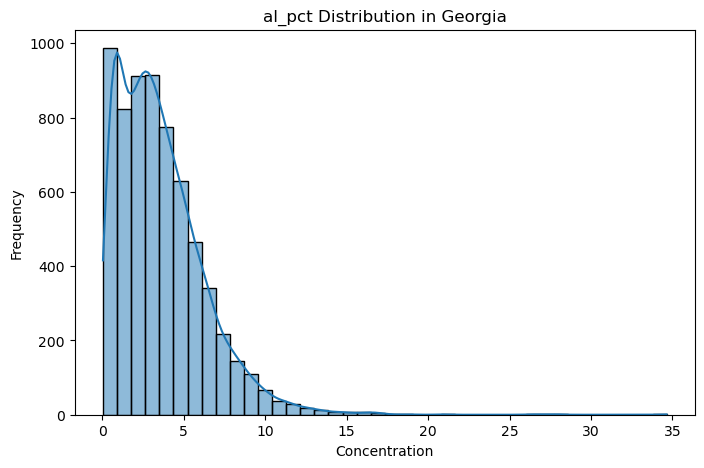

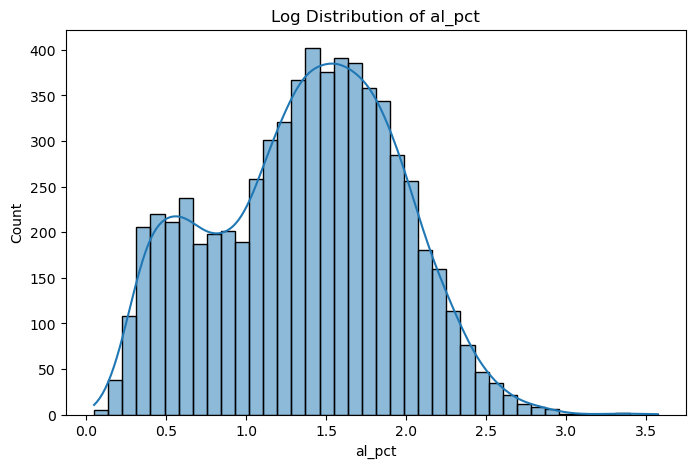

Coefficient of Variation: 0.744

 COSMETIC MATERIAL ANALYSIS
Interquartile Range (IQR): 3.44
Relatively uniform distribution → Good for industrial sourcing.
Normality test p-value: 0.0
Distribution is not normal (likely geochemically controlled).


In [53]:
# ============================================================
# CELL 8B — Domain-Relevant Statistical Analysis
# ============================================================

print("CELL STARTED")

import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

values = df_element["al_pct"]

print("================================================")
print("Statistical Summary for al_pct")
print("================================================")
print(values.describe())

# ------------------------------------------------
# 1️⃣ Distribution Shape
# ------------------------------------------------

plt.figure(figsize=(8,5))
sns.histplot(values, bins=40, kde=True)
plt.title("al_pct Distribution in Georgia")
plt.xlabel("Concentration")
plt.ylabel("Frequency")
plt.show()

# ------------------------------------------------
# 2️⃣ Log Distribution (Geochemical data is often log-normal)
# ------------------------------------------------

plt.figure(figsize=(8,5))
sns.histplot(np.log1p(values), bins=40, kde=True)
plt.title(f"Log Distribution of {element}")
plt.show()

# ------------------------------------------------
# 3️⃣ Coefficient of Variation (Variability Indicator)
# ------------------------------------------------

cv = values.std() / values.mean()
print("Coefficient of Variation:", round(cv, 3))

# ------------------------------------------------
# 4️⃣ Domain-Specific Interpretation
# ------------------------------------------------

if project_type == "energy":
    
    print("\n ENERGY TRANSITION ANALYSIS")
    
    # Top 5% high-value threshold
    high_threshold = values.quantile(0.95)
    high_count = (values > high_threshold).sum()
    
    print("Top 5% concentration threshold:", round(high_threshold, 3))
    print("Number of high-potential samples:", high_count)
    
    # Hypothesis test: Is distribution skewed?
    skewness = stats.skew(values.dropna())
    print("Skewness:", round(skewness, 3))
    
    if skewness > 1:
        print("Highly skewed → Possible localized resource enrichment zones.")
    else:
        print("Moderate distribution → No extreme enrichment clusters.")

elif project_type == "cosmetic":
    
    print("\n COSMETIC MATERIAL ANALYSIS")
    
    # Uniformity check (important for pigments/minerals)
    q1 = values.quantile(0.25)
    q3 = values.quantile(0.75)
    iqr = q3 - q1
    
    print("Interquartile Range (IQR):", round(iqr, 3))
    
    if iqr < values.mean():
        print("Relatively uniform distribution → Good for industrial sourcing.")
    else:
        print("Highly variable → Potential purity issues or heterogeneous deposits.")
    
    # Normality test (useful for industrial consistency)
    sample_for_test = values.dropna().sample(min(500, len(values)))
    stat, p = stats.shapiro(sample_for_test)
    print("Normality test p-value:", round(p, 5))
    
    if p > 0.05:
        print("Distribution is approximately normal.")
    else:
        print("Distribution is not normal (likely geochemically controlled).")

    plt.show()

In [54]:
# CELL 9 — Spatial Map

# create map centered on mean latitude/longitude of selected samples
m = folium.Map(
    location=[df_element.latitude.mean(), df_element.longitude.mean()],
    zoom_start=7
)

# add a circle marker for each sample location
for _, row in df_element.iterrows():
    folium.CircleMarker(
        location=[row.latitude, row.longitude],
        radius=3,
        fill=True
    ).add_to(m)

# display interactive map
m


In [55]:
# ============================================================
# CELL 9B — Element-Sensitive Spatial Map
# ============================================================

import branca.colormap as cm

values = df_element[element]  # concentrations for chosen element

# color scale mapped to concentration range
colormap = cm.linear.YlOrRd_09.scale(values.min(), values.max())
colormap.caption = f"{element} concentration"

# base map centered on mean coordinates
m = folium.Map(
    location=[df_element.latitude.mean(), df_element.longitude.mean()],
    zoom_start=7
)

# add markers colored by concentration
for _, row in df_element.iterrows():
    color = colormap(row[element])
    folium.CircleMarker(
        location=[row.latitude, row.longitude],
        radius=4,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=f"{element}: {round(row[element], 2)}"
    ).add_to(m)

# add legend (colorbar)
colormap.add_to(m)

# display map
m


In [57]:
# ============================================================
# CELL — Initialize OpenAI Client (Run Once)
# ============================================================

from openai import OpenAI
import os

# load API key from environment
openai_api_key = os.getenv("OPENAI_API_KEY")

# ensure key exists
if openai_api_key is None:
    raise ValueError("OPENAI_API_KEY environment variable not set.")

# create OpenAI client
client = OpenAI(api_key=openai_api_key)

print("OpenAI client initialized successfully.")


OpenAI client initialized successfully.


In [59]:
# Be patient; this may take a very long time!
# EMBEDDING CELL — With Progress Bar (8400 rows → ~9 batches)

# ============================================================
# CELL 10 — Batch Embeddings WITH Progress Bar + Caching
# ============================================================

import os
import pickle
import numpy as np
import faiss
from tqdm import tqdm
from openai import OpenAI

# ------------------------------------------------------------
# 1️⃣ Dynamic cache folder (separate per project type + element)
# ------------------------------------------------------------
CACHE_DIR = f"cache_{project_type}_{element}"
os.makedirs(CACHE_DIR, exist_ok=True)

TEXTS_FILE = os.path.join(CACHE_DIR, "texts.pkl")
EMB_FILE = os.path.join(CACHE_DIR, "embeddings.npy")
FAISS_FILE = os.path.join(CACHE_DIR, "faiss.index")

# ------------------------------------------------------------
# 2️⃣ Load cache if available (skip recomputation)
# ------------------------------------------------------------
if (
    os.path.exists(TEXTS_FILE)
    and os.path.exists(EMB_FILE)
    and os.path.exists(FAISS_FILE)
):
    print(" Loading cached embeddings...")

    with open(TEXTS_FILE, "rb") as f:
        texts = pickle.load(f)

    embeddings = np.load(EMB_FILE)
    index = faiss.read_index(FAISS_FILE)

    print(f" Loaded {index.ntotal} vectors from cache.")

else:
    print("🚀 No cache found. Computing embeddings...")

    # init OpenAI client (expects OPENAI_API_KEY in env)
    openai_api_key = os.getenv("OPENAI_API_KEY")
    client = OpenAI(api_key=openai_api_key)

    # ------------------------------------------------------------
    # 3️⃣ Build domain-aware text descriptions per sample
    # ------------------------------------------------------------
    mean_val = df_element[element].mean()
    p95 = df_element[element].quantile(0.95)

    texts = []
    for _, row in df_element.iterrows():
        concentration = row[element]

        # simple enrichment label from stats
        if concentration > p95:
            enrichment = "very high"
        elif concentration > mean_val:
            enrichment = "moderate"
        else:
            enrichment = "low"

        # include domain cue based on project type
        if project_type == "energy":
            text = (
                f"Georgia sample {row['rec_no']} at "
                f"{row['latitude']}, {row['longitude']}. "
                f"{element} concentration {concentration} ppm. "
                f"Enrichment level: {enrichment}. "
                f"Energy transition relevance."
            )
        else:
            text = (
                f"Georgia sample {row['rec_no']} at "
                f"{row['latitude']}, {row['longitude']}. "
                f"{element} concentration {concentration} ppm. "
                f"Enrichment level: {enrichment}. "
                f"Cosmetic material relevance."
            )

        texts.append(text)

    print(f"Prepared {len(texts)} descriptions.")

    # ------------------------------------------------------------
    # 4️⃣ Batch embeddings (progress bar for long runs)
    # ------------------------------------------------------------
    chunk_size = 1000
    all_embeddings = []

    for i in tqdm(range(0, len(texts), chunk_size), desc="Embedding Batches", unit="batch"):
        batch = texts[i:i + chunk_size]

        response = client.embeddings.create(
            model="text-embedding-3-large",
            input=batch
        )

        batch_embeddings = [item.embedding for item in response.data]
        all_embeddings.extend(batch_embeddings)

    print("All batches completed.")

    # ------------------------------------------------------------
    # 5️⃣ Build FAISS index (L2 similarity on float32 vectors)
    # ------------------------------------------------------------
    embeddings = np.array(all_embeddings).astype("float32")
    dimension = embeddings.shape[1]
    index = faiss.IndexFlatL2(dimension)
    index.add(embeddings)

    # ------------------------------------------------------------
    # 6️⃣ Save cache (texts, embeddings, FAISS index)
    # ------------------------------------------------------------
    with open(TEXTS_FILE, "wb") as f:
        pickle.dump(texts, f)

    np.save(EMB_FILE, embeddings)
    faiss.write_index(index, FAISS_FILE)

    print(f" Cached {index.ntotal} embeddings successfully.")

🚀 No cache found. Computing embeddings...
Prepared 6509 descriptions.


Embedding Batches: 100%|███████████████████████| 7/7 [01:51<00:00, 15.96s/batch]


All batches completed.
 Cached 6509 embeddings successfully.


In [60]:
# ============================================================
# CELL 11 — Domain-Aware QA System
# ============================================================

def ask_question(question, k=5):
    # embed the user question
    q_emb = client.embeddings.create(
        model="text-embedding-3-large",
        input=question
    ).data[0].embedding

    # search FAISS index for top-k nearest neighbors
    q_emb = np.array([q_emb]).astype("float32")
    D, I = index.search(q_emb, k)

    # retrieve matching sample descriptions
    retrieved_texts = [texts[i] for i in I[0]]

    # assemble context block for the LLM
    context_block = "\n\n".join(retrieved_texts)

    # domain-specific system prompt based on project type
    if project_type == "energy":
        system_prompt = (
            "You are a geochemistry and energy resource expert. "
            "Analyze the retrieved Georgia samples and answer based only on the provided data. "
            "Focus on resource enrichment, energy transition relevance, and spatial patterns."
        )
    else:
        system_prompt = (
            "You are a geochemistry and industrial mineral expert. "
            "Analyze the retrieved Georgia samples and answer based only on the provided data. "
            "Focus on material consistency, industrial usability, and spatial distribution."
        )

    # generate answer using retrieved context
    response = client.chat.completions.create(
        model="gpt-4o",
        messages=[
            {"role": "system", "content": system_prompt},
            {"role": "user", "content": f"""
Question:
{question}

Relevant Sample Data:
{context_block}

Provide a clear, concise scientific interpretation.
"""}
        ]
    )

    # return the LLM's reply text
    return response.choices[0].message.content

In [67]:
# ============================================================
# CELL 12 — Ask AI Questions About Your Selected Element
# ============================================================

# header info
print("==================================================")
print("PROJECT TYPE:", project_type.upper())
print("SELECTED ELEMENT:", element)            # e.g., "zn_ppm"
print("Embedded samples available:", index.ntotal)
print("==================================================\n")

# ------------------------------------------------------------
# 1️⃣ Guided question suggestions (examples to edit)
# ------------------------------------------------------------
print("Suggested questions you can modify:\n")

if project_type == "energy":
    print(f" - Is {element} spatially clustered in Georgia?")
    print(f" - Where are the highest {element} concentration zones?")
    print(f" - Does {element} show resource enrichment potential?")
    print(f" - Are there identifiable hotspots for {element}?")
else:
    print(f" - Is {element} evenly distributed across Georgia?")
    print(f" - Does {element} show strong spatial variability?")
    print(f" - Would {element} be suitable for industrial sourcing?")
    print(f" - Are concentrations regionally consistent for {element}?")

print("\n--------------------------------------------------")
print(" IMPORTANT: Edit ONLY the question below.")
print("Keep the 'f' and the {element} placeholder. Do NOT use {Zinc} or {Lithium}.")
print("Then re-run this cell.\n")

# ------------------------------------------------------------
# 🟢 EDIT ONLY THE LINE BELOW (keep f-string + {element})
# ------------------------------------------------------------
question = f"Could high concentrations of {element} pose environmental concerns in specific regions?"

# ------------------------------------------------------------
# 2️⃣ Run QA (retrieve → answer)
# ------------------------------------------------------------
answer = ask_question(question)

# show results
print("\n==================================================")
print("QUESTION:")
print(question)
print("\nAI INTERPRETATION:")
print(answer)
print("==================================================")

PROJECT TYPE: COSMETIC
SELECTED ELEMENT: al_pct
Embedded samples available: 6509

Suggested questions you can modify:

 - Is al_pct evenly distributed across Georgia?
 - Does al_pct show strong spatial variability?
 - Would al_pct be suitable for industrial sourcing?
 - Are concentrations regionally consistent for al_pct?

--------------------------------------------------
 IMPORTANT: Edit ONLY the question below.
Keep the 'f' and the {element} placeholder. Do NOT use {Zinc} or {Lithium}.
Then re-run this cell.


QUESTION:
Could high concentrations of al_pct pose environmental concerns in specific regions?

AI INTERPRETATION:
Based on the provided sample data from various locations in Georgia, we can make several observations regarding the concentration of al_pct and its potential environmental implications:

1. **Concentration Levels and Industrial Usability**:
   - The data indicates varying levels of al_pct, with concentrations ranging from 1.35 ppm (low) to 9.73 ppm (very high).
  